In [46]:
import tensorflow as tf

# Need to specify the memory_limit for my local machine for some reason, but didn't seem to be required
# on AWS machine
gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=6424)])

# Check tensorflow version
print("Using Tensorflow %s\n" % (tf.__version__))

# Check to see if graphics card is doing OK memory-wise
!nvidia-smi

Using Tensorflow 2.0.0

Sat Feb 22 09:59:18 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.59       Driver Version: 440.59       CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce RTX 207...  Off  | 00000000:43:00.0  On |                  N/A |
| 41%   23C    P8     3W / 215W |   7717MiB /  7974MiB |      1%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                    

In [2]:
# Using tensorboard to log data
%load_ext tensorboard

In [3]:
# Not used currently, but allows us to get top5 accuracy as well
from tensorflow.keras.metrics import top_k_categorical_accuracy

def top5(y_true, y_pred):
    return top_k_categorical_accuracy(y_true, y_pred, k=5)


In [4]:
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers

from sklearn import metrics

import numpy as np
import math



## Run this section if we are loading the previously trained model

In [7]:
#
# Only run this cell if we are loading from our pre-trained model for activity recognition
#
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

# If we used a custom metric, we need to define and pass it to load_model
dependencies = {
    'top5': top5
}


model =load_model("models/cam-frozen-convbase-1024-conv-layer-with-data-aug-500x500/60_epochs.h5", custom_objects=dependencies)

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2_input (I [(None, 500, 500, 3)]     0         
_________________________________________________________________
inception_resnet_v2 (Model)  (None, 14, 14, 1536)      54336736  
_________________________________________________________________
ClassConv (Conv2D)           (None, 14, 14, 1024)      14156800  
_________________________________________________________________
GAP (GlobalAveragePooling2D) (None, 1024)              0         
_________________________________________________________________
class (Dense)                (None, 40)                41000     
Total params: 68,534,536
Trainable params: 14,197,800
Non-trainable params: 54,336,736
_________________________________________________________________


## Create Model Using Inception-ResNetV2 Weights

In [5]:
#
# Only run this cell if we are not loading from our pre-trained model and building new model
# based on pre-trained InceptionResNetV2 trained from ImageNet
#
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

# Input pixel dimensions.  All training and test examples will be resized to (pixel, pixel, 3)
pixels = 500
conv_base = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(pixels,pixels,3))

# Freeze conv_base
conv_base.trainable = False


In [6]:
# Check out the Conv layers from InceptionResNetV2
conv_base.summary()

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 500, 500, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 249, 249, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 249, 249, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 249, 249, 32) 0           batch_normalization[0][0]        
________________________________________________________________________________

batch_normalization_191 (BatchN (None, 14, 14, 192)  576         conv2d_191[0][0]                 
__________________________________________________________________________________________________
batch_normalization_194 (BatchN (None, 14, 14, 256)  768         conv2d_194[0][0]                 
__________________________________________________________________________________________________
activation_191 (Activation)     (None, 14, 14, 192)  0           batch_normalization_191[0][0]    
__________________________________________________________________________________________________
activation_194 (Activation)     (None, 14, 14, 256)  0           batch_normalization_194[0][0]    
__________________________________________________________________________________________________
block8_8_mixed (Concatenate)    (None, 14, 14, 448)  0           activation_191[0][0]             
                                                                 activation_194[0][0]             
__________

In [7]:
# Now add in our own layers to the end
cam_model = models.Sequential()
cam_model.add(conv_base)
# Final activation layer for Class Activation Map
cam_model.add(layers.Conv2D(1024, (3, 3), padding="same", strides=(1, 1), activation="relu", name="ClassConv"))
# Global Average Pooling for Class Activation Map
cam_model.add(layers.GlobalAveragePooling2D(name="GAP"))
# Final 40-way softmax for our classification of 40 different human activities
cam_model.add(layers.Dense(40, activation="softmax", name="class"))

# Take a look at our new model
cam_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2 (Model)  (None, 14, 14, 1536)      54336736  
_________________________________________________________________
ClassConv (Conv2D)           (None, 14, 14, 1024)      14156800  
_________________________________________________________________
GAP (GlobalAveragePooling2D) (None, 1024)              0         
_________________________________________________________________
class (Dense)                (None, 40)                41000     
Total params: 68,534,536
Trainable params: 14,197,800
Non-trainable params: 54,336,736
_________________________________________________________________


In [10]:
# Update our model to return two outputs: (activation map from the final Conv Layer, softmax classification)
model = Model(inputs = cam_model.input, outputs = (cam_model.layers[2].input, cam_model.layers[-1].output))
                    
# Check out the shape of the weights of the final layer
all_amp_layer_weights = model.layers[-1].get_weights()[0]
all_amp_layer_weights.shape

(1024, 40)

In [12]:
# Check out the feature map shape of the final Conv Layer 
cam_shape = tuple(model.get_layer("ClassConv").output.get_shape().as_list()[1:])
cam_shape

(14, 14, 1024)

## Create train and test generators

In [13]:
# Need our own custom generator to handle this model which has two outputs
def multiple_outputs(generator, image_dir, batch_size, image_size):
    gen = generator.flow_from_directory(
        image_dir,
        target_size=(image_size, image_size),
        batch_size=batch_size,
        class_mode='categorical')
    
    while True:
        gnext = gen.next()
        yield gnext[0], [np.zeros((gnext[1].shape[0], *cam_shape)), gnext[1]]
        
        
# Add a little bit of data augmentation
train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, rotation_range=10, zoom_range= [0.9,1.1])
test_datagen = ImageDataGenerator(rescale=1./255)

In [14]:
# Batch size.  For 500x500x3 inputs, can only fit a very small number of training examples in a batch
BATCH_SIZE = 4

train_generator = multiple_outputs(train_datagen, 
                                   image_dir="Stanford40/train", 
                                   batch_size=BATCH_SIZE, 
                                   image_size=pixels)

valid_generator = multiple_outputs(test_datagen, 
                                   image_dir="Stanford40/test", 
                                   batch_size=BATCH_SIZE, 
                                   image_size=pixels)

train_temp = train_datagen.flow_from_directory("Stanford40/train", batch_size=BATCH_SIZE, target_size=(pixels,pixels), class_mode = 'categorical')
valid_temp = test_datagen.flow_from_directory("Stanford40/test", batch_size=BATCH_SIZE, target_size=(pixels,pixels), class_mode = 'categorical', shuffle=False)
y_true = valid_temp.classes

train_m = len(train_temp.classes)
valid_m = len(valid_temp.classes)

mapping = dict()
for activity, idx in train_temp.class_indices.items():
    mapping[idx] = activity

train_steps = math.ceil(train_m/BATCH_SIZE)
valid_steps = math.ceil(valid_m/BATCH_SIZE)



Found 6693 images belonging to 40 classes.
Found 2839 images belonging to 40 classes.


In [15]:
# callbacks for saving best model
filepath = "loss_guided_{epoch:02d}-{val_loss:.2f}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='min')

# call back for tensorboard
logdir = "models/cam-frozen-convbase-1024-conv-layer-with-data-aug-500x500/logs"
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)


In [16]:
model.compile(loss={'ClassConv': 'categorical_crossentropy', 'class': 'categorical_crossentropy'},
              loss_weights=[0.0, 1.0], optimizer=optimizers.Adam(lr=2e-5), metrics = ['acc'])


In [17]:
# These variables are used to help add the training history into the existing tensorboard logs so that the existing history instead overwritten
prev_epochs = 0
epochs = 60

In [18]:
# Train!
history = model.fit_generator(train_generator, steps_per_epoch=train_steps, initial_epoch=prev_epochs, epochs=epochs, validation_data=valid_generator, validation_steps=valid_steps, callbacks=[tensorboard_callback, checkpoint])

Found 6693 images belonging to 40 classes.
Epoch 1/60
1673/1674 [============================>.] - ETA: 0s - loss: 2.1542 - ClassConv_loss: 0.0000e+00 - class_loss: 2.1542 - ClassConv_acc: 0.0014 - class_acc: 0.4616Found 2839 images belonging to 40 classes.

Epoch 00001: val_loss improved from inf to 0.91069, saving model to loss_guided_01-0.91.h5
1674/1674 [==============================] - 1191s 711ms/step - loss: 2.1548 - ClassConv_loss: 0.0000e+00 - class_loss: 2.1548 - ClassConv_acc: 0.0014 - class_acc: 0.4615 - val_loss: 0.9107 - val_ClassConv_loss: 0.0000e+00 - val_class_loss: 0.9107 - val_ClassConv_acc: 0.0041 - val_class_acc: 0.7626
Epoch 2/60
1673/1674 [============================>.] - ETA: 0s - loss: 1.1845 - ClassConv_loss: 0.0000e+00 - class_loss: 1.1845 - ClassConv_acc: 0.0032 - class_acc: 0.6760
Epoch 00002: val_loss improved from 0.91069 to 0.79410, saving model to loss_guided_02-0.79.h5
1674/1674 [==============================] - 1189s 710ms/step - loss: 1.1856 - Cla

Epoch 16/60
1673/1674 [============================>.] - ETA: 0s - loss: 0.5826 - ClassConv_loss: 0.0000e+00 - class_loss: 0.5826 - ClassConv_acc: 3.0344e-04 - class_acc: 0.8289
Epoch 00016: val_loss improved from 0.59971 to 0.59836, saving model to loss_guided_16-0.60.h5
1674/1674 [==============================] - 1238s 740ms/step - loss: 0.5844 - ClassConv_loss: 0.0000e+00 - class_loss: 0.5844 - ClassConv_acc: 3.0339e-04 - class_acc: 0.8288 - val_loss: 0.5984 - val_ClassConv_loss: 0.0000e+00 - val_class_loss: 0.5984 - val_ClassConv_acc: 3.8998e-04 - val_class_acc: 0.8390
Epoch 17/60
1673/1674 [============================>.] - ETA: 0s - loss: 0.5508 - ClassConv_loss: 0.0000e+00 - class_loss: 0.5508 - ClassConv_acc: 0.0015 - class_acc: 0.8410
Epoch 00017: val_loss did not improve from 0.59836
1674/1674 [==============================] - 1237s 739ms/step - loss: 0.5513 - ClassConv_loss: 0.0000e+00 - class_loss: 0.5513 - ClassConv_acc: 0.0015 - class_acc: 0.8410 - val_loss: 0.7054 - va

1673/1674 [============================>.] - ETA: 0s - loss: 0.3305 - ClassConv_loss: 0.0000e+00 - class_loss: 0.3305 - ClassConv_acc: 3.9645e-04 - class_acc: 0.9017
Epoch 00046: val_loss did not improve from 0.55276
1674/1674 [==============================] - 1304s 779ms/step - loss: 0.3317 - ClassConv_loss: 0.0000e+00 - class_loss: 0.3317 - ClassConv_acc: 3.9639e-04 - class_acc: 0.9015 - val_loss: 0.5941 - val_ClassConv_loss: 0.0000e+00 - val_class_loss: 0.5941 - val_ClassConv_acc: 1.1502e-04 - val_class_acc: 0.8454
Epoch 47/60
1673/1674 [============================>.] - ETA: 0s - loss: 0.3058 - ClassConv_loss: 0.0000e+00 - class_loss: 0.3058 - ClassConv_acc: 4.0865e-04 - class_acc: 0.9074
Epoch 00047: val_loss did not improve from 0.55276
1674/1674 [==============================] - 1257s 751ms/step - loss: 0.3064 - ClassConv_loss: 0.0000e+00 - class_loss: 0.3064 - ClassConv_acc: 4.0859e-04 - class_acc: 0.9074 - val_loss: 0.6523 - val_ClassConv_loss: 0.0000e+00 - val_class_loss: 0

## Saving the Model

In [23]:
model.save("models/cam-frozen-convbase-1024-conv-layer-with-data-aug-500x500/60_epochs.h5")

In [8]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2_input (I [(None, 500, 500, 3)]     0         
_________________________________________________________________
inception_resnet_v2 (Model)  (None, 14, 14, 1536)      54336736  
_________________________________________________________________
ClassConv (Conv2D)           (None, 14, 14, 1024)      14156800  
_________________________________________________________________
GAP (GlobalAveragePooling2D) (None, 1024)              0         
_________________________________________________________________
class (Dense)                (None, 40)                41000     
Total params: 68,534,536
Trainable params: 14,197,800
Non-trainable params: 54,336,736
_________________________________________________________________


## Plotting Loss and Acc

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['class_acc'])
plt.plot(history.history['val_class_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'dev'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'dev'], loc='upper left')
plt.show()

## Setting Up to Generate Confusion Matrix

In [35]:
# Redefine the generators with shuffle = False
cam_shape = tuple(model.get_layer("ClassConv").output.get_shape().as_list()[1:])

# custom generator
def multiple_outputs(generator, image_dir, batch_size, image_size):
    gen = generator.flow_from_directory(
        image_dir,
        target_size=(image_size, image_size),
        batch_size=batch_size,
        class_mode='categorical', shuffle=False)
    
    while True:
        gnext = gen.next()
        yield gnext[0], [np.zeros((gnext[1].shape[0], *cam_shape)), gnext[1]]

In [36]:
BATCH_SIZE = 4

pixels = 500

valid_datagen = ImageDataGenerator(rescale=1./255)

valid_generator = multiple_outputs(valid_datagen, 
                                   image_dir="Stanford40/test", 
                                   batch_size=BATCH_SIZE, 
                                   image_size=pixels)

valid_temp = valid_datagen.flow_from_directory("Stanford40/test", batch_size=BATCH_SIZE, target_size=(pixels,pixels), class_mode = 'categorical', shuffle=False)

# Get the ground truth-labels, it's important that the generators had the setting shuffle = False
y_true = valid_temp.classes

# Used for calculating step size for validation set
valid_m = len(valid_temp.classes)

# Get the mapping dictionary from activity index to activity name such as "cooking"
mapping = dict()
for activity, idx in valid_temp.class_indices.items():
    mapping[idx] = activity


valid_steps = math.ceil(valid_m/BATCH_SIZE)


Found 2839 images belonging to 40 classes.


In [37]:
len(y_true)

2839

In [ ]:
score = model.evaluate_generator(valid_generator, valid_steps)

In [17]:
score

[0.5694487010795721, 0.0, 0.569449, 0.0002767574, 0.8506516]

In [39]:
# Run the forward pass on our validation set
_, predictions = model.predict_generator(valid_generator, valid_steps)

Found 2839 images belonging to 40 classes.


In [40]:
# Pick the prediction to be the one with the highest probability for each image in the validation set
predictions = predictions.argmax(axis=1)

In [41]:
len(predictions)

2839

In [42]:
# Check out the accuracy for our validation set
(y_true == predictions).mean()

0.8506516379006692

In [44]:
# Create our matrix using sci-kit learn
matrix = metrics.confusion_matrix(y_true, predictions)

## Plot confusion matrix

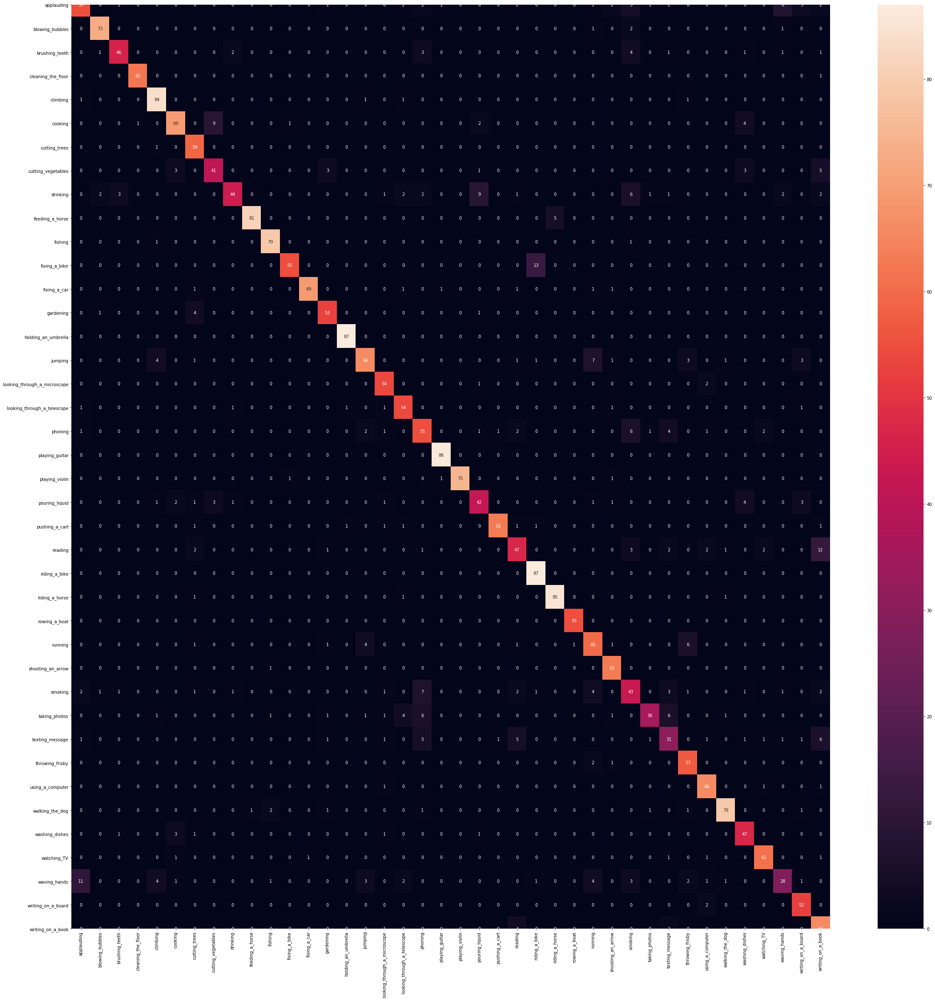

In [45]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

# Let's plot the confusion matrix
df_cm = pd.DataFrame(matrix, index = [mapping[i] for i in range(40)], columns = [mapping[i] for i in range(40)])
plt.figure(figsize = (40, 40))
sn.heatmap(df_cm, annot=True)

Looking at the confusion matrix, it looks like we are doing a pretty good job at classifying the activity classes.
The areas with the most misclassifications are activities that may look similar such as:

* drinking vs. pouring liquid
* riding a bike vs. fixing a bike
* reading vs. writing on a book



## Predicting from own image

In [ ]:
model.summary()

In [40]:
all_amp_layer_weights=model.layers[-1].get_weights()[0]

In [41]:
all_amp_layer_weights.shape

(1024, 40)

In [19]:
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

def predict(img_path, model, all_amp_layer_weights):
    
    # Load and preprocess image
    img = image.load_img(img_path, target_size=(pixels,pixels))
    
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    
    processed_input = preprocess_input(x)
    
    # Run model's prediction to output from last Conv Layer + category prediction
    last_conv_output, pred_vec = model.predict(processed_input)
    # Only 1 training example, so remove batch dimension
    last_conv_output = np.squeeze(last_conv_output)
    # Get category with highest probability
    pred = np.argmax(pred_vec)
    
    scale = pixels / last_conv_output.shape[0]
    filters = last_conv_output.shape[2]
    
    # Rescale to input image size
    mat_for_mult = scipy.ndimage.zoom(last_conv_output, (scale,scale,1), order=1)
    
    # Get the weights associated with the predicted class
    amp_layer_weights = all_amp_layer_weights[:, pred]
    
    # Weighted sum of the activation maps for the predicted class.
    # Then resize back to original image size.
    final_output = np.dot(mat_for_mult.reshape((pixels*pixels, filters)), amp_layer_weights).reshape(pixels,pixels)
    
    return final_output, mapping[pred]
    

.........................

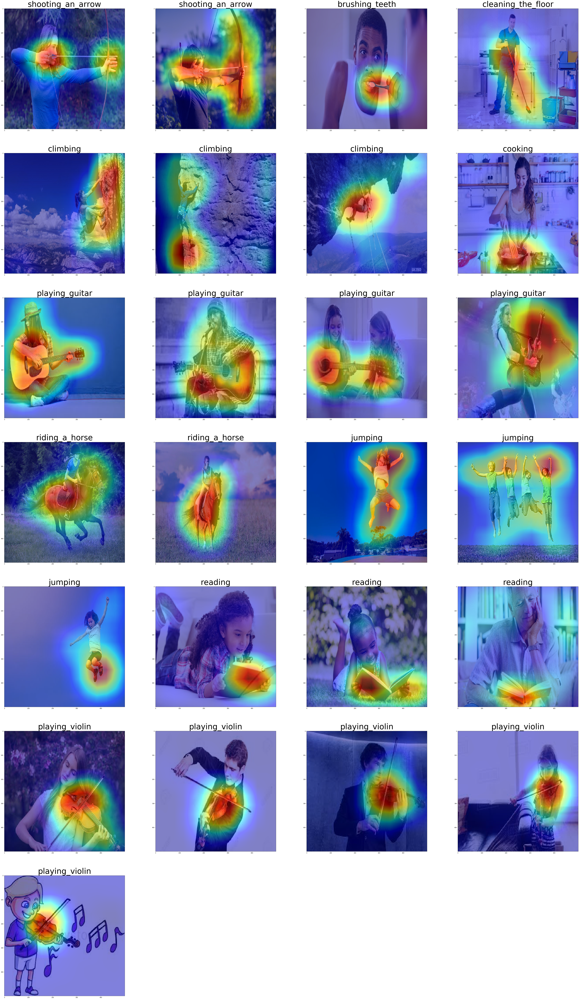

In [20]:
import matplotlib.pyplot as plt
import scipy
import glob

from tensorflow.keras.preprocessing import image

# Images downloaded from internet search engine to try out activity classification
# Images are under images/ directory 
image_dir = "images/"
pattern  = image_dir + "*"
test_images = sorted(glob.glob(pattern))

# Details for the grid size
columns = 4
rows = math.ceil(len(test_images) / columns)
fig = plt.figure(figsize=(80, 20 * rows))

for i, image_name in enumerate(test_images):

    # Progress report
    print(".", end = '')
    image_path = image_dir + image_name
    
    ax = fig.add_subplot(rows, columns, i+1)

    # Load and display original image
    img = tf.keras.preprocessing.image.load_img(image_name, target_size=(pixels,pixels))
    plt.imshow(img)
    
    # Run forward pass to get the Class Activity Map and the predicted class
    cam, pred = predict(image_name, model, all_amp_layer_weights)
    
    # Display class activation map
    plt.imshow(cam, cmap='jet', alpha=0.5)
    # Set title to that of predicted class
    ax.set_title(pred, fontsize =60)
    
    
plt.show()